The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

The images for camera calibration are stored in the folder called camera_cal. The images in test_images are for testing the pipeline on single frames. 

The current working directory is C:\Users\Tomek\Desktop\Udacity\CarND-Advanced-Lane-Finding-P4\CarND-Advanced-Lane-Lines

-------------------------------------
Processing image: camera_cal\calibration1.jpg
Original image:


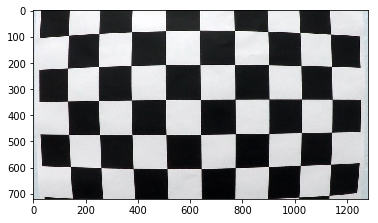

Ret = False

-------------------------------------
Processing image: camera_cal\calibration10.jpg
Original image:


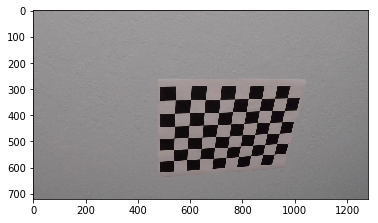

Ret = True
Image with detected corners:


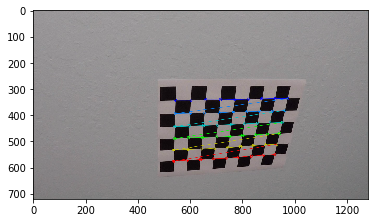


-------------------------------------
Processing image: camera_cal\calibration11.jpg
Original image:


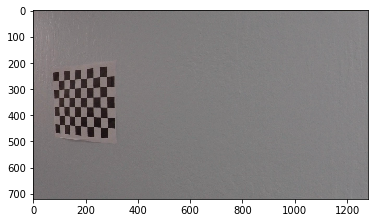

Ret = True
Image with detected corners:


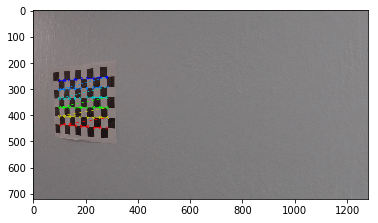


-------------------------------------
Processing image: camera_cal\calibration12.jpg
Original image:


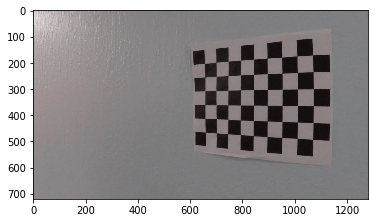

Ret = True
Image with detected corners:


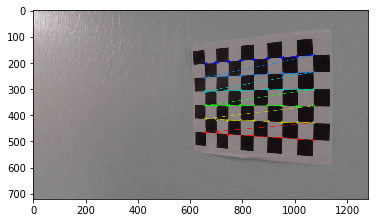


-------------------------------------
Processing image: camera_cal\calibration13.jpg
Original image:


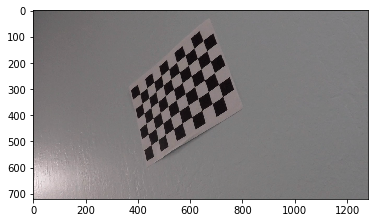

Ret = True
Image with detected corners:


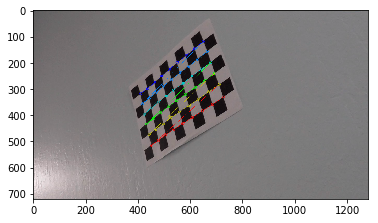


-------------------------------------
Processing image: camera_cal\calibration14.jpg
Original image:


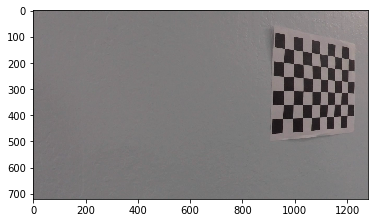

Ret = True
Image with detected corners:


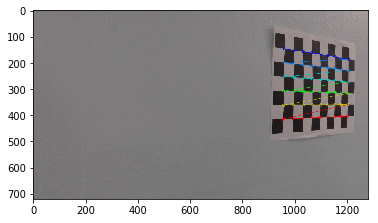


-------------------------------------
Processing image: camera_cal\calibration15.jpg
Original image:


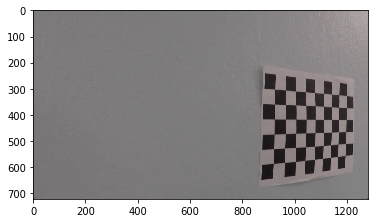

Ret = True
Image with detected corners:


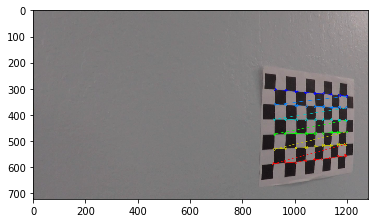


-------------------------------------
Processing image: camera_cal\calibration16.jpg
Original image:


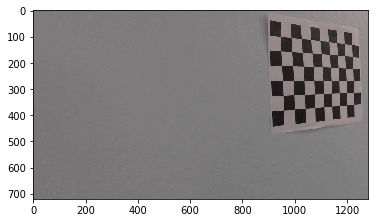

Ret = True
Image with detected corners:


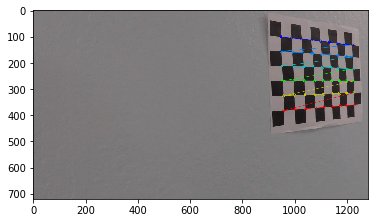


-------------------------------------
Processing image: camera_cal\calibration17.jpg
Original image:


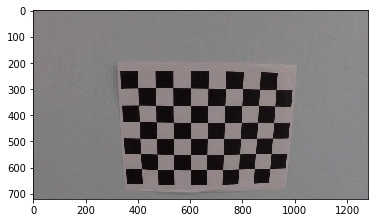

Ret = True
Image with detected corners:


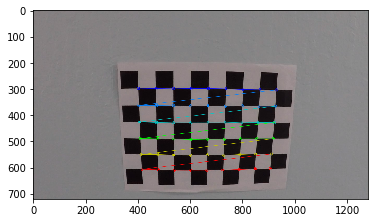


-------------------------------------
Processing image: camera_cal\calibration18.jpg
Original image:


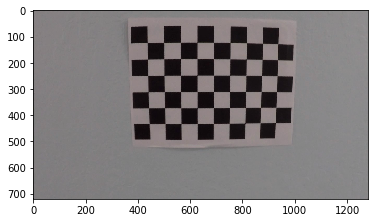

Ret = True
Image with detected corners:


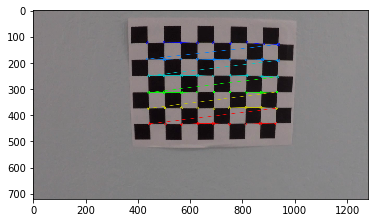


-------------------------------------
Processing image: camera_cal\calibration19.jpg
Original image:


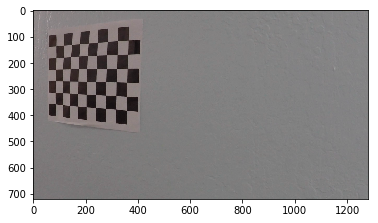

Ret = True
Image with detected corners:


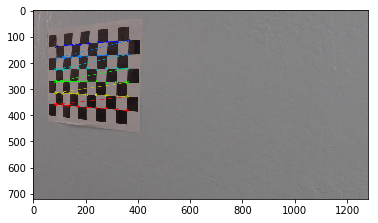


-------------------------------------
Processing image: camera_cal\calibration2.jpg
Original image:


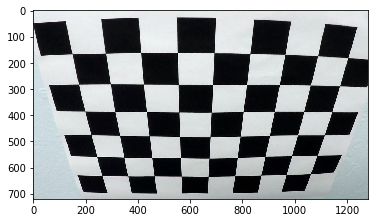

Ret = True
Image with detected corners:


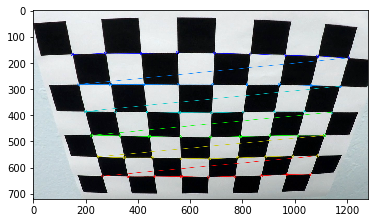


-------------------------------------
Processing image: camera_cal\calibration20.jpg
Original image:


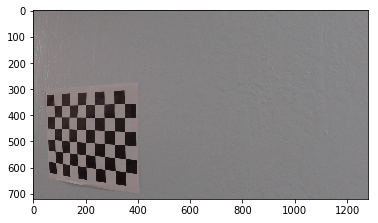

Ret = True
Image with detected corners:


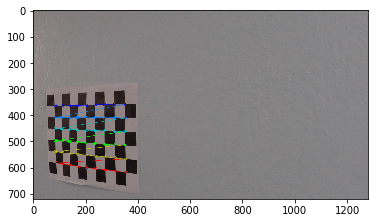


-------------------------------------
Processing image: camera_cal\calibration3.jpg
Original image:


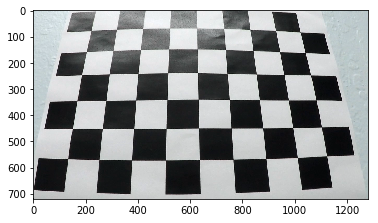

Ret = True
Image with detected corners:


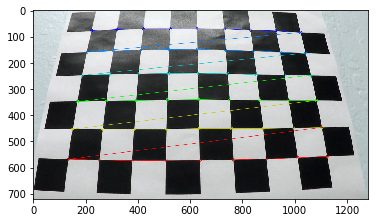


-------------------------------------
Processing image: camera_cal\calibration4.jpg
Original image:


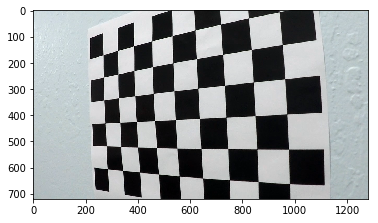

Ret = False

-------------------------------------
Processing image: camera_cal\calibration5.jpg
Original image:


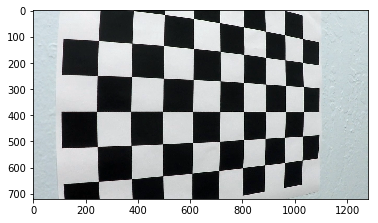

Ret = False

-------------------------------------
Processing image: camera_cal\calibration6.jpg
Original image:


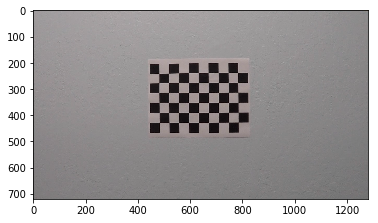

Ret = True
Image with detected corners:


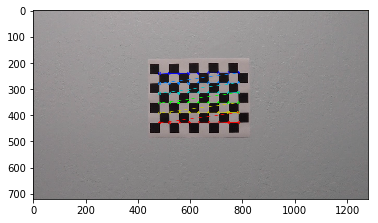


-------------------------------------
Processing image: camera_cal\calibration7.jpg
Original image:


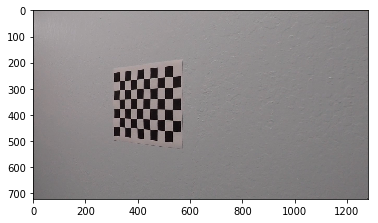

Ret = True
Image with detected corners:


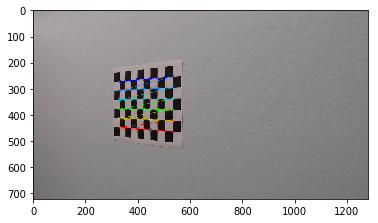


-------------------------------------
Processing image: camera_cal\calibration8.jpg
Original image:


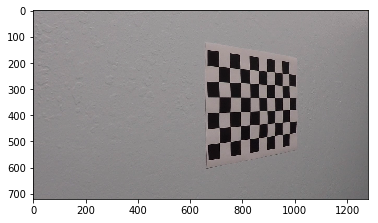

Ret = True
Image with detected corners:


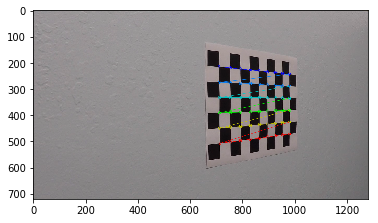


-------------------------------------
Processing image: camera_cal\calibration9.jpg
Original image:


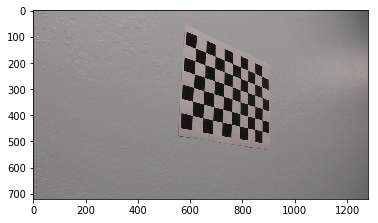

Ret = True
Image with detected corners:


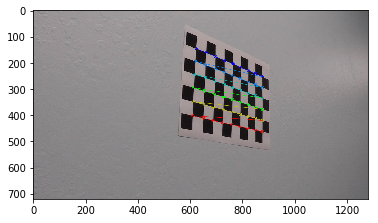

**************
Camera calibration parameters defined!
**************


In [1]:
##### 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images. #####

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import glob
%matplotlib inline

print ("The current working directory is", os.getcwd())

# Read in and make a list of calibration images using the glob API
#img = mpimg.imread('camera_cal\calibration1.jpg')
#img = cv2.imread('camera_cal\calibration1.jpg')
#imgplot = plt.imshow(img)
#plt.show()

images = glob.glob('camera_cal\calibration*.jpg')
#print("The following images have been read in:")
#for fname in images:
#    print(fname)

# Arrays to store object points and image points from all the images

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

objp = np.zeros((6*9, 3), np.float32)

objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x, y coordinates

for fname in images:
    #Read in an image:
    print()
    print("-------------------------------------")
    print("Processing image:", fname)
    img = cv2.imread(fname)
    print ("Original image:")
    imgplot = plt.imshow(img)
    plt.show()

    # Convert image to grayscale (in case cv2 is used from BGR)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    print("Ret =", ret)

    # If corners are found, add object points, image points
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
    
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        print("Image with detected corners:")
        imgplot = plt.imshow(img)
        plt.show()

# Camera calibration matrix and distortion coefficients:     
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print("**************")
print("Camera calibration parameters defined!")
print("**************")

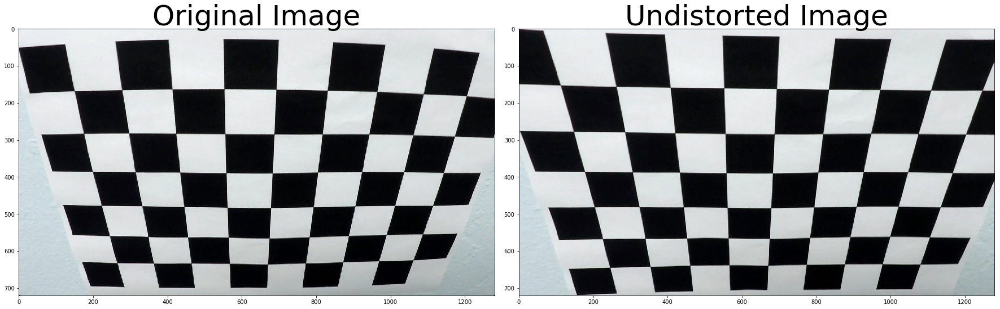

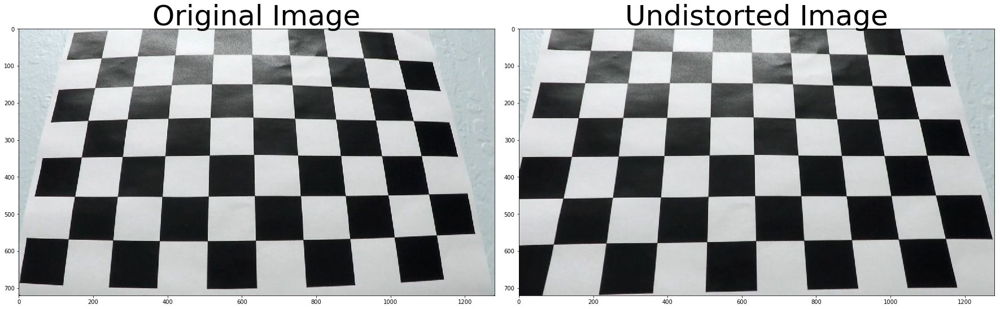

In [2]:
##### 2. Test distortion correction #####

# Defining undistortion function using the camera calibration parameters found earlier
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

#Testing on 2 images where I can easily see the difference between distorted and undistorted image:
img = cv2.imread('camera_cal\calibration2.jpg')
undistorted = undistort(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

img = cv2.imread('camera_cal\calibration3.jpg')
undistorted = undistort(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [3]:
##### 3. Use color transforms, gradients, etc., to create a thresholded binary image #####

# Defining absolute sobel transformation
# The function applies Sobel x or y, then takes an absolute value and applies a threshold.

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Definining a function that applies a threshold to the overall magnitude of the gradient, in both x and y directions. 
# The function applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    abs_sobelxy = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobelxy = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobelxy)
    binary_output[(scaled_sobelxy >= mag_thresh[0]) & (scaled_sobelxy <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Defining a function that applies a threshold to the direction of the gradient (np.arctan2(abs_sobely, abs_sobelx))
# The function applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    gradient_direction = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(gradient_direction)
    binary_output[(gradient_direction >= thresh[0]) & (gradient_direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Defining combination of L and S channel filtering:
def color_and_gradient_filter(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the L and S channels
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary >= 1) | (s_binary >= 1)] = 1
    #print("Combined_binary shape:", combined_binary.shape)
    #print("Color_binary shape:", color_binary.shape)
    #return color_binary
    return combined_binary

# Defining a new filter:
#def new_filter(img, s_thresh=(170, 255), sx_thresh=(20, 100), R_thresh=(220, 255)):
def new_filter(img, s_thresh=(170, 255), sx_thresh=(20, 100), R_thresh=(255, 255), l_thresh=(220,255)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the L and S channels
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x for L channel
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient for L channel
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold S-color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Thresholding R-color channel 
    R = img[:,:,0]
    R_binary = np.zeros_like(R)
    R_binary[(R >= R_thresh[0]) & (R <= R_thresh[1])] = 1
    
    # Thresholding L-channel w/o sobel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1) | (R_binary == 1) | (l_binary == 1)] = 1
    
    return combined_binary

def l_and_b_filter(img, l_thresh=(225, 255), b_thresh=(150, 255)):
    img = np.copy(img)
    
    # Convert to LUV color space and separate the L channel
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV).astype(np.float)
    l_channel = luv[:,:,0]
    # Thresholding L-channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Convert to LAB color space and separate the B channel
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB).astype(np.float)
    b_channel = lab[:,:,2]
    # Thresholding B-color channel 
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh[0]) & (b_channel <= b_thresh[1])] = 1
    
    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    return combined_binary

def new_filter_2(img, s_thresh=(170, 255), sx_thresh=(40, 100), l_thresh=(255, 254), b_thresh=(150, 255)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the L and S channels
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x for L channel
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient for L channel
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold S-color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    # Convert to LUV color space and separate the L channel - detection of white
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV).astype(np.float)
    l_channel = luv[:,:,0]
    # Thresholding L-channel
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    # Convert to LAB color space and separate the B channel - detection of yellow
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB).astype(np.float)
    b_channel = lab[:,:,2]
    # Thresholding B-color channel 
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh[0]) & (b_channel <= b_thresh[1])] = 1
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1) | (l_binary == 1) | (b_binary == 1)] = 1
    
    return combined_binary

In [4]:
##### 4. Apply a perspective transform to rectify binary image ("birds-eye view") #####

def perspective_transform(img):
    # Define source points - corners of the trapezoid shape..
    src = np.float32([[200, 719], [1108, 719],[535, 490],[750, 490]]) # was 539
    # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    dst = np.float32([[370, 720], [929, 720],[370, 490],[929, 490]]) #was 719
    # Use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Use cv2.warpPerspective() to warp your image to a top-down view
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR) 
    return warped, Minv

In [5]:
##### Function for masking of the warped(!) image #####

def mask_image(img):
    # Create a masked edges image using cv2.fillPoly()
    height,width = img.shape
    #height,width,depth = img.shape
    mask = np.zeros((height,width), np.uint8)
    ignore_mask_color = 255

    # Define a four sided polygon to mask
    imshape = img.shape
    left_bottom = [300, imshape[0]]
    left_top = [50, 0]
    right_top = [imshape[1]-50, 0]
    right_bottom = [imshape[1]-300,imshape[0]]
    vertices = np.array([[left_bottom, left_top, right_top, right_bottom]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(img, img, mask = mask)
    return masked_image

In [6]:
##### Lane lines detection #####

def detect_lane_lines(binary_warped, plotting = False):

    if left_fit_curve_last_results:
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        left_fit = left_fit_curve_last_results[-1]
        right_fit = right_fit_curve_last_results[-1]

        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    else:    
    
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
        if plotting == True:
            print("Histogram:")
            imgplot = plt.plot(histogram)
            plt.show()
        # Create an output image to draw on and  visualize the result
        #out_img = binary_warped*255
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    if plotting == True:
        print("Fitted polynomials:")
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        imgplot = plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        
    # Calculate radius of curvature - in meters(!)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    #Define y coordinate of the bottom of each line:
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the radii of curvature in meteres(!)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    avg_curverad = (left_curverad + right_curverad)/2
    # Now the radius of curvature is in meters
    #print("Left line curvature:", left_curverad, "m")
    #print("Right line curvature:", right_curverad, "m")
    #print("Average lane curvature: {0:6.1f}".format(avg_curverad), "m")
    
    # Calculate vehicle position vs. center of the lane - assuming that the camera is exactly in the middle of vehicle
    left_lane_bottom_x_px = left_fit[0]*binary_warped.shape[0]**2 + left_fit[1]*binary_warped.shape[0] + left_fit[2]
    right_lane_bottom_x_px = right_fit[0]*binary_warped.shape[0]**2 + right_fit[1]*binary_warped.shape[0] + right_fit[2]
    middle_of_lane_x_px_real = (right_lane_bottom_x_px - left_lane_bottom_x_px)/2 + left_lane_bottom_x_px # this is where the real middle of lane is
    middle_of_lane_x_px_vehicle = binary_warped.shape[1]/2 # this is where the middle of vehicle is
    vehicle_position_x_px = middle_of_lane_x_px_vehicle - middle_of_lane_x_px_real
    vehicle_position_x_meters = vehicle_position_x_px * xm_per_pix # converting pixels to meters
    #print("Left line bottom in px:", left_lane_bottom_x_px)
    #print("Right line bottom in px:", right_lane_bottom_x_px)
    #print("Middle of lane in px:", middle_of_lane_x_px_real)
    #print("Middle of vehicle in px:", middle_of_lane_x_px_vehicle)
    #print("Vehicle position vs. lane middle (-left / +right) in px:", vehicle_position_x_px)
    #print("Vehicle position vs. lane middle (-left / +right) in meters: {0:6.3f}".format(vehicle_position_x_meters), "m")
    
    return ploty, left_fitx, right_fitx, avg_curverad, vehicle_position_x_meters, left_fit, right_fit

In [7]:
##### 6. Warp the detected lane boundaries back onto the original image #####

def unwarp_and_draw(binary_warped, ploty, left_fitx, right_fitx, Minv, undist, avg_curverad, vehicle_position_x_meters, plotting = False):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    #Plot additional details on the image
    #cv2.putText(img, text, org, fontFace, fontScale, color[, thickness[, lineType[, bottomLeftOrigin]]])
    
    curvature = str("Lane curvature: "+str(round(avg_curverad, 1))+"m")
    position = str("Vehicle position: "+str(round(vehicle_position_x_meters, 3))+"m")
    fontFace = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    #org = (np.int(0.5*result.shape[1]), np.int(0.5*result.shape[0]))
    org1 = (450, 75)
    org2 = (450, 125)
    color = (255,255,255)
    cv2.putText(result, curvature, org1, fontFace, fontScale, color, 3)
    cv2.putText(result, position, org2, fontFace, fontScale, color, 3)
    
    if plotting == True:
        # Display the image
        print("Final output:")
        imgplot = plt.imshow(result)
        plt.show()
    
    #if plotting == False:
    #    result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    
    return result

In [10]:
##### Define the image processing pipeline #####

def processing_pipeline(img, plotting = False):
        
    ### 1. Apply a distortion correction to raw images.
    
    if plotting == True:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # converting from BGR to RGB for displaying and next steps
    
    undistorted = undistort(img)
    
    if plotting == True:
        print("Original image:")
        imgplot = plt.imshow(img)
        plt.show()
        print("Undistorted image:")
        imgplot = plt.imshow(undistorted)
        plt.show()
    
    ### 2. Use color transforms, gradients, etc., to create a thresholded binary image.
    ## OPTION 1: Sobel, magnitude and direction of the gradient combined
    # Choose a Sobel kernel size
    #ksize = 3 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    #gradx = abs_sobel_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    #grady = abs_sobel_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    #mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(30, 100))
    #dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.7, 1.3))

    #Try different combinations and see what you get.
    #For example, here is a selection for pixels where both the x and y gradients meet the threshold criteria, 
    #or the gradient magnitude and direction are both within their threshold values.
    #combined = np.zeros_like(dir_binary)
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    ## OPTION 2: combined color and gradient thresholds
    #combined = color_and_gradient_filter(undistorted)
    #combined = new_filter(undistorted)
    combined = l_and_b_filter(undistorted)
    #combined = new_filter_2(undistorted)

    # Plot the result
    if plotting == True:
        print("Combined thresholds:")
        imgplot = plt.imshow(combined, cmap='gray') # if grayscale is used - OPTION 1
        #imgplot = plt.imshow(combined) # if RGB (or HLS) image is used - OPTION 2
        plt.show()
    
    # 3. Apply a perspective transform to rectify binary image ("birds-eye view").
    warped, Minv = perspective_transform(combined)
    if plotting == True:
        print("Warped image / perspective transform:")
        imgplot = plt.imshow(warped, cmap='gray') # if RGB (or HLS) image is used - OPTION 2
        plt.show()
    
    ### 3b. Apply region of interest masking.
    warped = mask_image(warped)
    if plotting == True:
        print("Masked warped image:")
        imgplot = plt.imshow(warped, cmap='gray')
        plt.show()
    
    # 4. Detect lane pixels and fit to find the lane boundary.
    # 5. Determine the curvature of the lane and vehicle position with respect to center.
    ploty, left_fitx, right_fitx, avg_curverad, vehicle_position_x_meters, left_fit, right_fit = detect_lane_lines(warped, plotting = plotting)
    
    if plotting == False: #i.e. processing video frames
        
        global bad_frames_counter
        
        #Sanity check:
        if left_fitx_last_results: # making sure that deque is not empty (could also check with the right one)
            #if (abs(left_fitx[0] - left_fitx_last_results[-1][0]) > 50) | (abs(right_fitx[0] - right_fitx_last_results[-1][0]) > 50):
            if (((right_fitx[0] - left_fitx[0]) < 375) | ((right_fitx[0] - left_fitx[0]) > 700) | ((right_fitx[-1] - left_fitx[-1]) < 375)| ((right_fitx[-1] - left_fitx[-1]) > 700)):
                print("*** Frame skipped due to bad results ***")
                print("left_fitx[0] =", left_fitx[0])
                print("right_fitx[0] =", right_fitx[0])
                print("left_fitx[-1] =", left_fitx[-1])
                print("right_fitx[-1] =", right_fitx[-1])
                left_fitx = left_fitx_last_results[-1] # assigning previous NEWEST value to current value
                right_fitx = right_fitx_last_results[-1] # assigning previous NEWEST value to current value
                left_fit = left_fit_curve_last_results[-1] # assigning previous NEWEST value to current value
                right_fit = right_fit_curve_last_results[-1] # assigning previous NEWEST value to current value
                print("updated left_fitx[0] =", left_fitx[0])
                print("updated right_fitx[0] =", right_fitx[0])
                print("updated left_fitx[-1] =", left_fitx[-1])
                print("updated right_fitx[-1] =", right_fitx[-1])
                
                bad_frames_counter += 1 # increment bad frames counter
                
            else:
                bad_frames_counter = 0 # reset bad frames counter
        
        # Append current results to the colloections of previous results
        left_fitx_last_results.append(left_fitx)
        right_fitx_last_results.append(right_fitx)
        avg_curverad_last_results.append(avg_curverad)
        left_fit_curve_last_results.append(left_fit)
        right_fit_curve_last_results.append(right_fit)
        
        # Calculate running averages
        count = 0
        sum1 = 0
        for elem in left_fitx_last_results:
            sum1 += elem
            count += 1
        avg_left_fitx_last_results = sum1 / count
        
        count = 0
        sum1 = 0
        for elem in right_fitx_last_results:
            sum1 += elem
            count += 1
        avg_right_fitx_last_results = sum1 / count
        
        count = 0
        sum1 = 0
        for elem in avg_curverad_last_results:
            sum1 += elem
            count += 1
        avg_avg_curverad_last_results = sum1 / count
        
        if bad_frames_counter == 10: #start searching from scratch
            left_fitx_last_results.clear()
            right_fitx_last_results.clear()
            avg_curverad_last_results.clear()
            left_fit_curve_last_results.clear()
            right_fit_curve_last_results.clear()
            bad_frames_counter = 0

    # 6. Warp the detected lane boundaries back onto the original image.
    # 7. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    
    if plotting == True:
        final_result = unwarp_and_draw(warped, ploty, left_fitx, right_fitx, Minv, undistorted, avg_curverad, vehicle_position_x_meters, plotting = plotting)
    
    if plotting == False: # use averages
        final_result = unwarp_and_draw(warped, ploty, avg_left_fitx_last_results, avg_right_fitx_last_results, Minv, undistorted, avg_avg_curverad_last_results, vehicle_position_x_meters, plotting = plotting)
    
    return final_result

Processing image: test_images\straight_lines1.jpg
Original image:


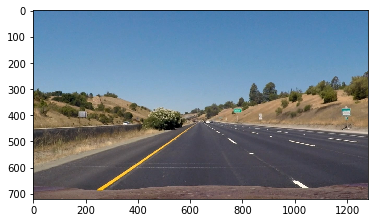

Undistorted image:


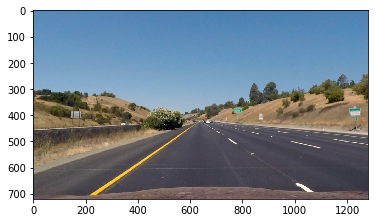

Combined thresholds:


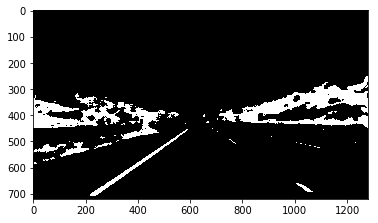

Warped image / perspective transform:


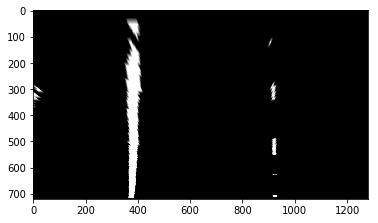

Masked warped image:


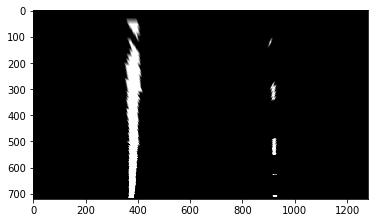

Histogram:


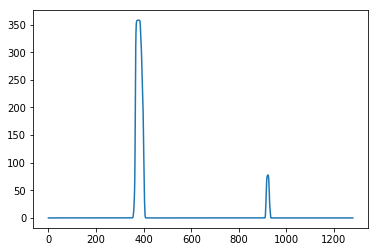

Fitted polynomials:


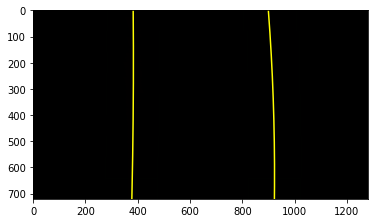

Final output:


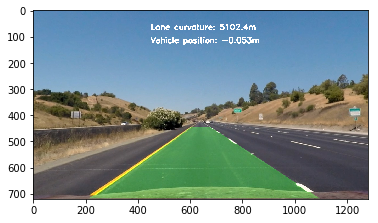

*******************************************************************
Processing image: test_images\straight_lines2.jpg
Original image:


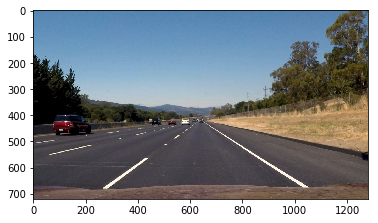

Undistorted image:


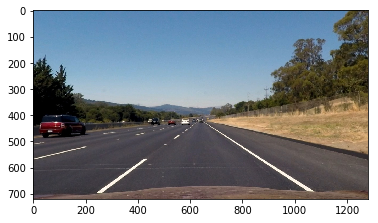

Combined thresholds:


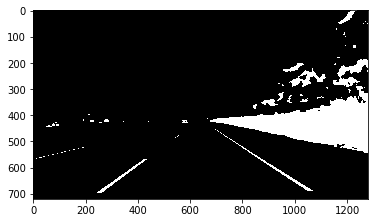

Warped image / perspective transform:


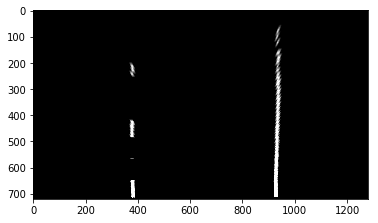

Masked warped image:


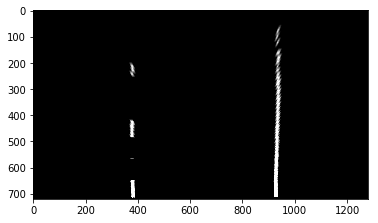

Histogram:


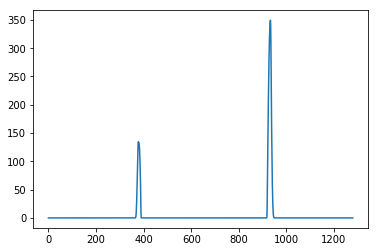

Fitted polynomials:


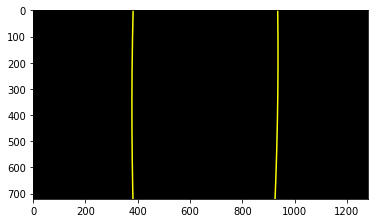

Final output:


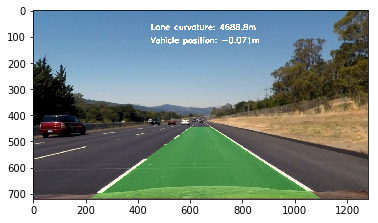

*******************************************************************
Processing image: test_images\test1.jpg
Original image:


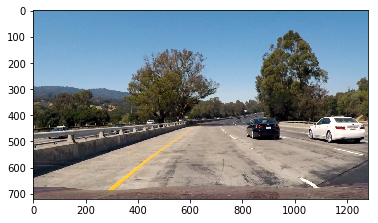

Undistorted image:


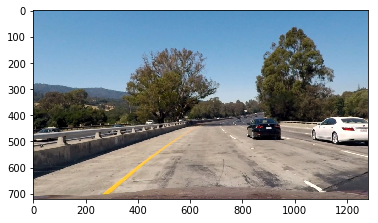

Combined thresholds:


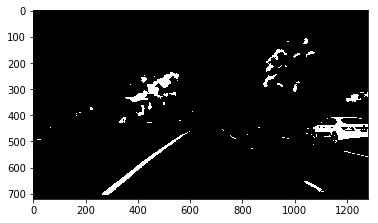

Warped image / perspective transform:


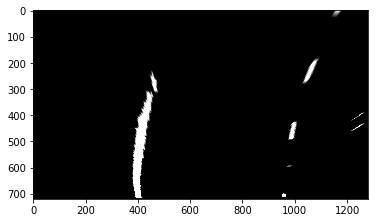

Masked warped image:


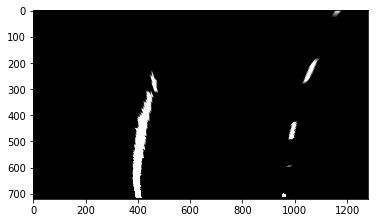

Histogram:


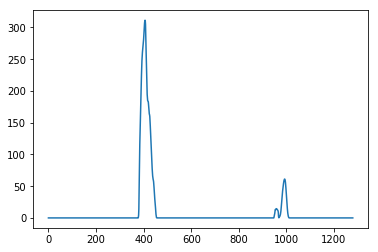

Fitted polynomials:


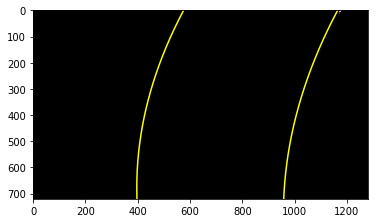

Final output:


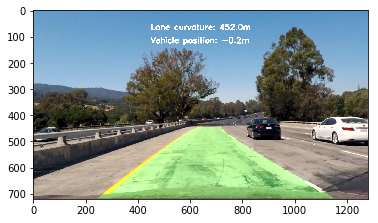

*******************************************************************
Processing image: test_images\test2.jpg
Original image:


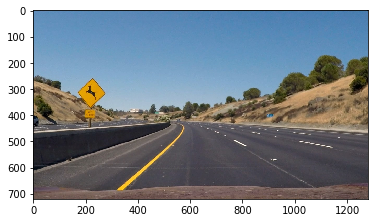

Undistorted image:


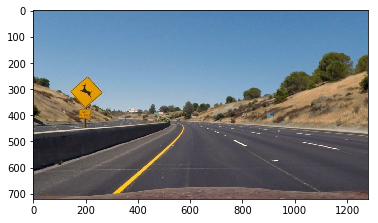

Combined thresholds:


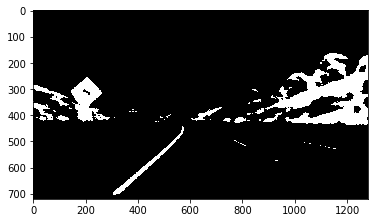

Warped image / perspective transform:


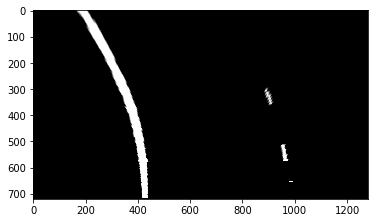

Masked warped image:


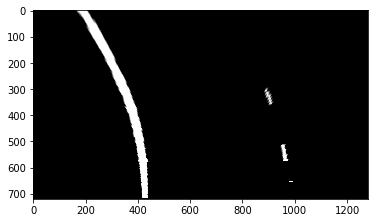

Histogram:


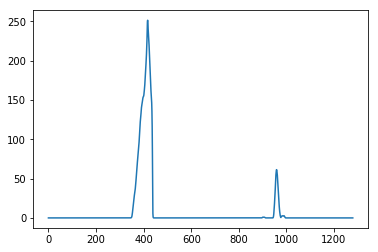

Fitted polynomials:


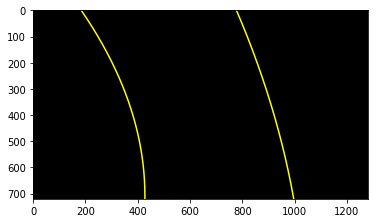

Final output:


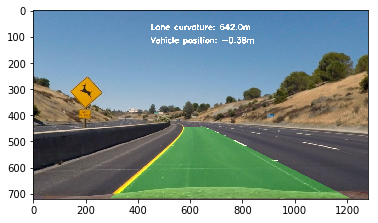

*******************************************************************
Processing image: test_images\test3.jpg
Original image:


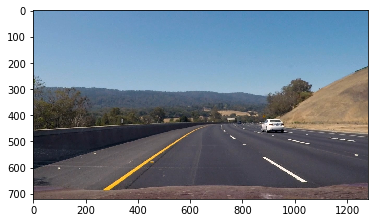

Undistorted image:


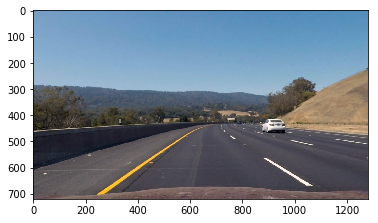

Combined thresholds:


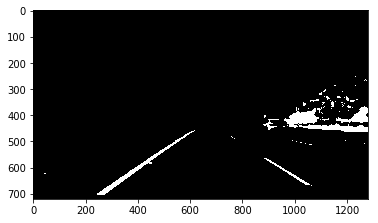

Warped image / perspective transform:


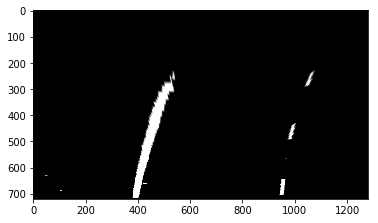

Masked warped image:


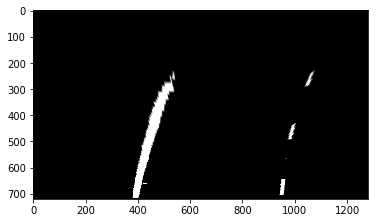

Histogram:


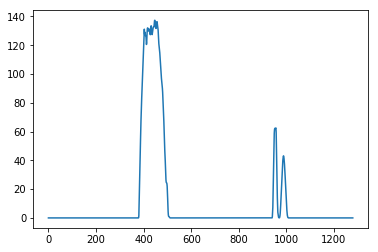

Fitted polynomials:


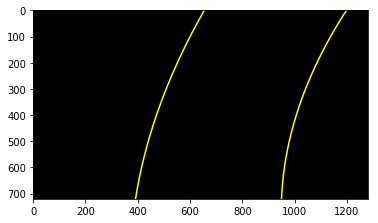

Final output:


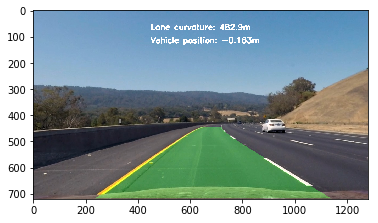

*******************************************************************
Processing image: test_images\test4.jpg
Original image:


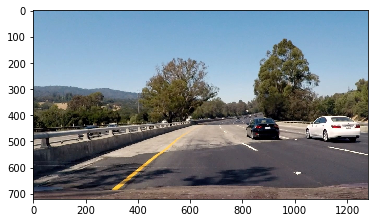

Undistorted image:


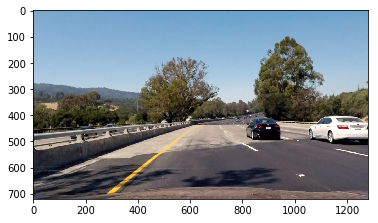

Combined thresholds:


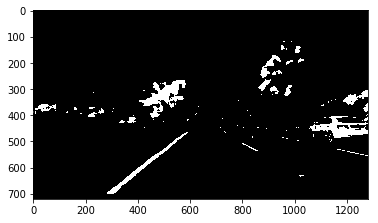

Warped image / perspective transform:


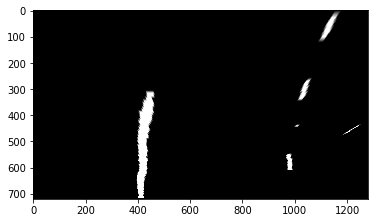

Masked warped image:


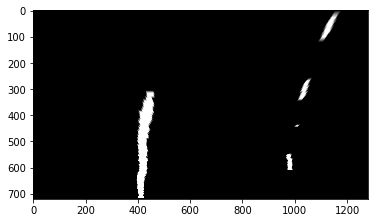

Histogram:


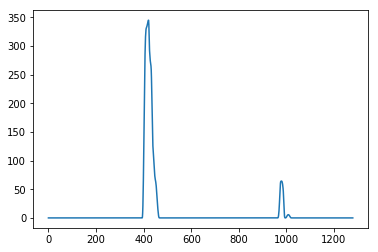

Fitted polynomials:


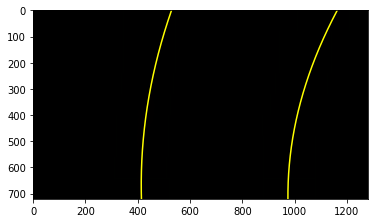

Final output:


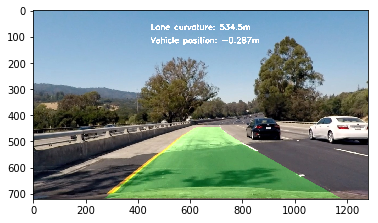

*******************************************************************
Processing image: test_images\test5.jpg
Original image:


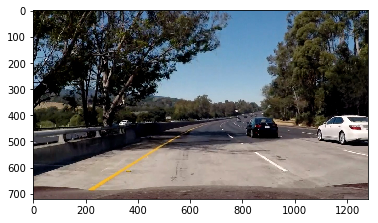

Undistorted image:


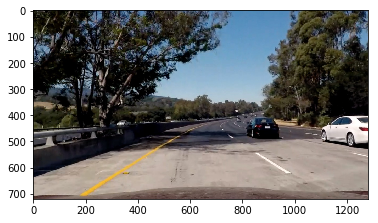

Combined thresholds:


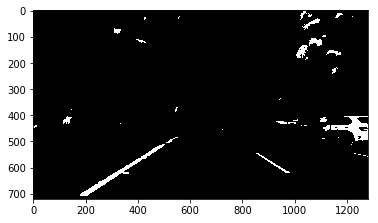

Warped image / perspective transform:


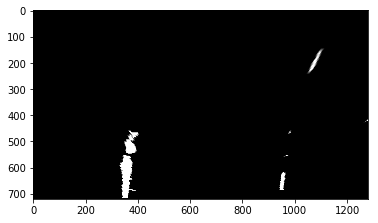

Masked warped image:


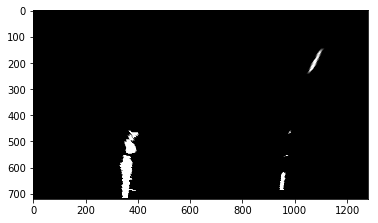

Histogram:


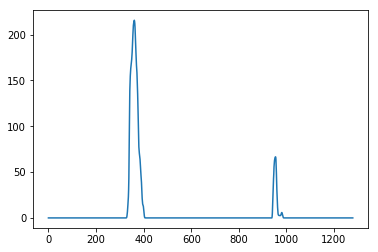

Fitted polynomials:


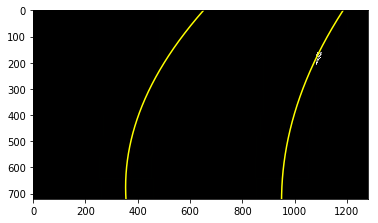

Final output:


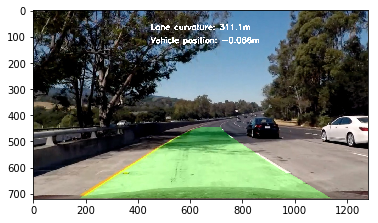

*******************************************************************
Processing image: test_images\test6.jpg
Original image:


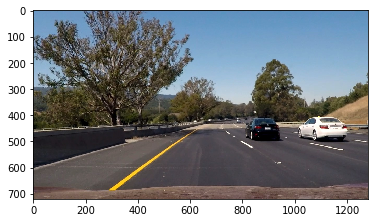

Undistorted image:


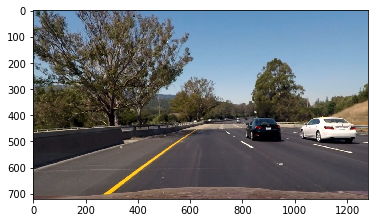

Combined thresholds:


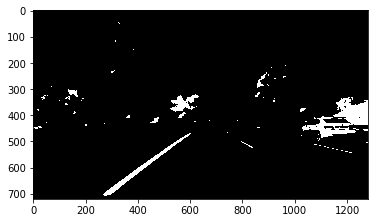

Warped image / perspective transform:


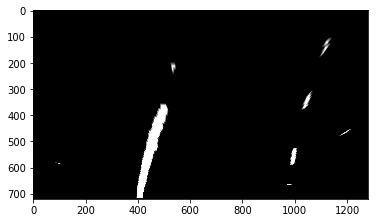

Masked warped image:


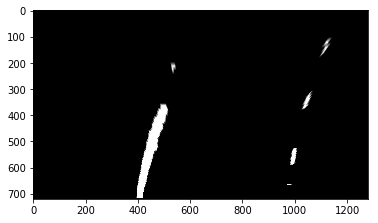

Histogram:


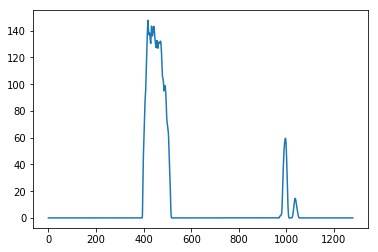

Fitted polynomials:


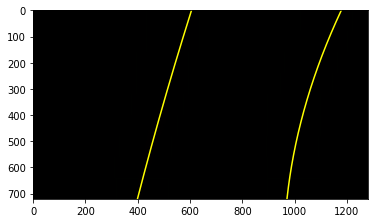

Final output:


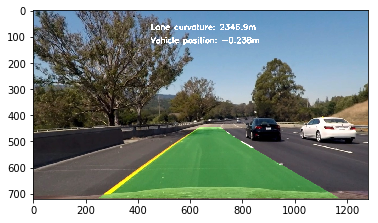

*******************************************************************
****************** Finished processing images ******************


In [12]:
##### Test the pipeline on single images #####

images = glob.glob('test_images\*.jpg')

for fname in images:
    print("Processing image:", fname)
    img = cv2.imread(fname)
    processing_pipeline(img, plotting = True)
    print("*******************************************************************")
print("****************** Finished processing images ******************")

In [11]:
##### Testing the pipeline on video stream ######

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Initialize deque collections to calculate running averages
from collections import deque
left_fitx_last_results = deque(maxlen=6)
right_fitx_last_results = deque(maxlen=6)
avg_curverad_last_results = deque(maxlen=6)
left_fit_curve_last_results = deque(maxlen=2)
right_fit_curve_last_results = deque(maxlen=2)
bad_frames_counter = 0

project_video_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
project_video_clip = clip1.fl_image(processing_pipeline) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_video_output, audio=False)

#Clear deque collections for the next run
left_fitx_last_results.clear()
right_fitx_last_results.clear()
avg_curverad_last_results.clear()
left_fit_curve_last_results.clear()
right_fit_curve_last_results.clear()

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


 44%|█████████████████████████████████████▏                                              | 558/1261 [02:54<03:45,  3.11it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 313.397182179
right_fitx[0] = 1047.62366045
left_fitx[-1] = 378.443490884
right_fitx[-1] = 960.937318628
updated left_fitx[0] = 335.135372491
updated right_fitx[0] = 1014.80613904
updated left_fitx[-1] = 382.585001988
updated right_fitx[-1] = 955.421769152


 44%|█████████████████████████████████████▏                                              | 559/1261 [02:55<04:12,  2.78it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 273.124759883
right_fitx[0] = 1094.03597692
left_fitx[-1] = 374.306332703
right_fitx[-1] = 966.173619284
updated left_fitx[0] = 335.135372491
updated right_fitx[0] = 1014.80613904
updated left_fitx[-1] = 382.585001988
updated right_fitx[-1] = 955.421769152


 44%|█████████████████████████████████████▎                                              | 560/1261 [02:55<04:31,  2.58it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 270.00828032
right_fitx[0] = 1107.85867002
left_fitx[-1] = 370.930547393
right_fitx[-1] = 966.24017155
updated left_fitx[0] = 335.135372491
updated right_fitx[0] = 1014.80613904
updated left_fitx[-1] = 382.585001988
updated right_fitx[-1] = 955.421769152


 44%|█████████████████████████████████████▎                                              | 561/1261 [02:56<04:54,  2.38it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 261.282923184
right_fitx[0] = 1117.59590172
left_fitx[-1] = 370.132677368
right_fitx[-1] = 970.502889961
updated left_fitx[0] = 335.135372491
updated right_fitx[0] = 1014.80613904
updated left_fitx[-1] = 382.585001988
updated right_fitx[-1] = 955.421769152


 45%|█████████████████████████████████████▍                                              | 562/1261 [02:56<05:08,  2.27it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 289.710369169
right_fitx[0] = 1093.85325048
left_fitx[-1] = 370.213039611
right_fitx[-1] = 968.190663624
updated left_fitx[0] = 335.135372491
updated right_fitx[0] = 1014.80613904
updated left_fitx[-1] = 382.585001988
updated right_fitx[-1] = 955.421769152


 47%|███████████████████████████████████████▏                                            | 589/1261 [03:05<03:34,  3.13it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 298.69526178
right_fitx[0] = 1028.11808697
left_fitx[-1] = 382.540827545
right_fitx[-1] = 967.610027229
updated left_fitx[0] = 365.842651574
updated right_fitx[0] = 1008.79906452
updated left_fitx[-1] = 385.749198713
updated right_fitx[-1] = 967.368609357


 47%|███████████████████████████████████████▎                                            | 590/1261 [03:06<03:59,  2.80it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 290.249513417
right_fitx[0] = 1043.06984605
left_fitx[-1] = 379.410908955
right_fitx[-1] = 965.578111372
updated left_fitx[0] = 365.842651574
updated right_fitx[0] = 1008.79906452
updated left_fitx[-1] = 385.749198713
updated right_fitx[-1] = 967.368609357


 47%|███████████████████████████████████████▎                                            | 591/1261 [03:06<04:15,  2.62it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 275.47372067
right_fitx[0] = 1039.62956661
left_fitx[-1] = 378.297262476
right_fitx[-1] = 962.278098561
updated left_fitx[0] = 365.842651574
updated right_fitx[0] = 1008.79906452
updated left_fitx[-1] = 385.749198713
updated right_fitx[-1] = 967.368609357


 47%|███████████████████████████████████████▍                                            | 592/1261 [03:06<04:27,  2.50it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 255.200786543
right_fitx[0] = 1019.39742638
left_fitx[-1] = 376.42307773
right_fitx[-1] = 955.156038638
updated left_fitx[0] = 365.842651574
updated right_fitx[0] = 1008.79906452
updated left_fitx[-1] = 385.749198713
updated right_fitx[-1] = 967.368609357


 47%|███████████████████████████████████████▌                                            | 593/1261 [03:07<04:35,  2.43it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 278.933467949
right_fitx[0] = 1029.17749988
left_fitx[-1] = 376.216768148
right_fitx[-1] = 955.577323769
updated left_fitx[0] = 365.842651574
updated right_fitx[0] = 1008.79906452
updated left_fitx[-1] = 385.749198713
updated right_fitx[-1] = 967.368609357


 47%|███████████████████████████████████████▊                                            | 597/1261 [03:08<03:56,  2.80it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 252.489857721
right_fitx[0] = 1051.14761784
left_fitx[-1] = 373.44520809
right_fitx[-1] = 953.854138583
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 47%|███████████████████████████████████████▊                                            | 598/1261 [03:09<04:10,  2.64it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 302.505664631
right_fitx[0] = 1042.94467129
left_fitx[-1] = 373.502813239
right_fitx[-1] = 952.874008142
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|███████████████████████████████████████▉                                            | 599/1261 [03:09<04:17,  2.57it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 314.755735055
right_fitx[0] = 1083.12287307
left_fitx[-1] = 373.059069743
right_fitx[-1] = 951.5946215
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|███████████████████████████████████████▉                                            | 600/1261 [03:10<04:32,  2.42it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 340.446821894
right_fitx[0] = 1077.61198071
left_fitx[-1] = 367.543419304
right_fitx[-1] = 969.449451783
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|████████████████████████████████████████                                            | 601/1261 [03:10<04:35,  2.39it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 348.317415481
right_fitx[0] = 1094.98254925
left_fitx[-1] = 367.422227236
right_fitx[-1] = 977.881100582
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|████████████████████████████████████████                                            | 602/1261 [03:11<04:41,  2.34it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 356.471054346
right_fitx[0] = 1098.38148765
left_fitx[-1] = 365.24521673
right_fitx[-1] = 966.977050346
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|████████████████████████████████████████▏                                           | 603/1261 [03:11<04:39,  2.35it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 351.7674363
right_fitx[0] = 1092.03722203
left_fitx[-1] = 363.062615538
right_fitx[-1] = 965.24028571
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|████████████████████████████████████████▏                                           | 604/1261 [03:11<04:42,  2.32it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 367.780062598
right_fitx[0] = 1110.50440399
left_fitx[-1] = 363.157483967
right_fitx[-1] = 968.5866548
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|████████████████████████████████████████▎                                           | 605/1261 [03:12<04:47,  2.28it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 402.091624211
right_fitx[0] = 1103.58354135
left_fitx[-1] = 364.314227991
right_fitx[-1] = 961.538965898
updated left_fitx[0] = 368.478145085
updated right_fitx[0] = 1045.83798527
updated left_fitx[-1] = 379.298348488
updated right_fitx[-1] = 954.462685274


 48%|████████████████████████████████████████▍                                           | 607/1261 [03:13<04:29,  2.43it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 376.117942985
right_fitx[0] = 1098.67923207
left_fitx[-1] = 360.683824768
right_fitx[-1] = 952.300529215
updated left_fitx[0] = 411.118089589
updated right_fitx[0] = 1097.78321976
updated left_fitx[-1] = 364.185273843
updated right_fitx[-1] = 955.167744177


 50%|█████████████████████████████████████████▋                                          | 625/1261 [03:18<03:21,  3.16it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 842.327334054
right_fitx[0] = 1191.47905537
left_fitx[-1] = 369.520914539
right_fitx[-1] = 925.069448517
updated left_fitx[0] = 767.132686211
updated right_fitx[0] = 1175.06924691
updated left_fitx[-1] = 363.598760272
updated right_fitx[-1] = 924.283649937


 50%|█████████████████████████████████████████▋                                          | 626/1261 [03:19<03:44,  2.83it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 800.765817889
right_fitx[0] = 1145.74793038
left_fitx[-1] = 368.330617943
right_fitx[-1] = 925.732514689
updated left_fitx[0] = 767.132686211
updated right_fitx[0] = 1175.06924691
updated left_fitx[-1] = 363.598760272
updated right_fitx[-1] = 924.283649937


 50%|█████████████████████████████████████████▊                                          | 627/1261 [03:19<04:00,  2.64it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 814.516285548
right_fitx[0] = 1134.90262534
left_fitx[-1] = 370.296780761
right_fitx[-1] = 925.051398971
updated left_fitx[0] = 767.132686211
updated right_fitx[0] = 1175.06924691
updated left_fitx[-1] = 363.598760272
updated right_fitx[-1] = 924.283649937


 50%|█████████████████████████████████████████▊                                          | 628/1261 [03:20<04:08,  2.55it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 793.189136666
right_fitx[0] = 1162.57146442
left_fitx[-1] = 368.453569496
right_fitx[-1] = 935.565892374
updated left_fitx[0] = 767.132686211
updated right_fitx[0] = 1175.06924691
updated left_fitx[-1] = 363.598760272
updated right_fitx[-1] = 924.283649937


 79%|█████████████████████████████████████████████████████████████████▉                 | 1001/1261 [05:21<01:23,  3.13it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 474.164455471
right_fitx[0] = 1213.07570976
left_fitx[-1] = 381.604749591
right_fitx[-1] = 988.685472408
updated left_fitx[0] = 518.231422988
updated right_fitx[0] = 1194.71148925
updated left_fitx[-1] = 390.064308593
updated right_fitx[-1] = 985.213499476


 79%|█████████████████████████████████████████████████████████████████▉                 | 1002/1261 [05:21<01:32,  2.81it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 434.174845495
right_fitx[0] = 1222.2098677
left_fitx[-1] = 373.833552495
right_fitx[-1] = 989.268282126
updated left_fitx[0] = 518.231422988
updated right_fitx[0] = 1194.71148925
updated left_fitx[-1] = 390.064308593
updated right_fitx[-1] = 985.213499476


 80%|██████████████████████████████████████████████████████████████████                 | 1003/1261 [05:22<01:40,  2.57it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 405.598255563
right_fitx[0] = 1231.96933482
left_fitx[-1] = 368.954005494
right_fitx[-1] = 986.980059564
updated left_fitx[0] = 518.231422988
updated right_fitx[0] = 1194.71148925
updated left_fitx[-1] = 390.064308593
updated right_fitx[-1] = 985.213499476


 80%|██████████████████████████████████████████████████████████████████                 | 1004/1261 [05:22<01:47,  2.40it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 394.789535953
right_fitx[0] = 1243.03382585
left_fitx[-1] = 364.771532556
right_fitx[-1] = 990.787032268
updated left_fitx[0] = 518.231422988
updated right_fitx[0] = 1194.71148925
updated left_fitx[-1] = 390.064308593
updated right_fitx[-1] = 985.213499476


 80%|██████████████████████████████████████████████████████████████████▏                | 1006/1261 [05:23<01:42,  2.48it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 473.823033701
right_fitx[0] = 1184.95453705
left_fitx[-1] = 375.579385203
right_fitx[-1] = 969.883309598
updated left_fitx[0] = 507.385021717
updated right_fitx[0] = 1178.34204483
updated left_fitx[-1] = 376.724497751
updated right_fitx[-1] = 969.586164273


 80%|██████████████████████████████████████████████████████████████████▍                | 1010/1261 [05:24<01:30,  2.78it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 465.780181026
right_fitx[0] = 1183.60005679
left_fitx[-1] = 370.003612219
right_fitx[-1] = 957.33508747
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 80%|██████████████████████████████████████████████████████████████████▌                | 1011/1261 [05:25<01:37,  2.57it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 450.061703482
right_fitx[0] = 1189.70634502
left_fitx[-1] = 371.6526396
right_fitx[-1] = 957.677044702
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 80%|██████████████████████████████████████████████████████████████████▌                | 1012/1261 [05:25<01:44,  2.38it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 429.769541651
right_fitx[0] = 1190.54061018
left_fitx[-1] = 364.923831956
right_fitx[-1] = 954.509730302
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 80%|██████████████████████████████████████████████████████████████████▋                | 1013/1261 [05:26<01:47,  2.32it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 435.439550018
right_fitx[0] = 1188.89528398
left_fitx[-1] = 366.624303184
right_fitx[-1] = 954.930974681
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 80%|██████████████████████████████████████████████████████████████████▋                | 1014/1261 [05:26<01:50,  2.24it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 447.62702786
right_fitx[0] = 1197.46084932
left_fitx[-1] = 369.523623618
right_fitx[-1] = 954.027886432
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 80%|██████████████████████████████████████████████████████████████████▊                | 1015/1261 [05:27<01:47,  2.28it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 449.485402838
right_fitx[0] = 1201.41981576
left_fitx[-1] = 368.68264707
right_fitx[-1] = 954.540548653
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 81%|██████████████████████████████████████████████████████████████████▊                | 1016/1261 [05:27<01:58,  2.07it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 417.227067209
right_fitx[0] = 1194.50269865
left_fitx[-1] = 360.942080165
right_fitx[-1] = 949.518209321
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 81%|██████████████████████████████████████████████████████████████████▉                | 1017/1261 [05:28<01:52,  2.16it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 423.132367408
right_fitx[0] = 1191.25291285
left_fitx[-1] = 361.583045606
right_fitx[-1] = 946.839421416
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 81%|███████████████████████████████████████████████████████████████████                | 1018/1261 [05:28<01:57,  2.08it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 445.047664002
right_fitx[0] = 1195.70963083
left_fitx[-1] = 364.712438409
right_fitx[-1] = 948.299140786
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 81%|███████████████████████████████████████████████████████████████████                | 1019/1261 [05:29<01:53,  2.12it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 416.308366116
right_fitx[0] = 1222.84556119
left_fitx[-1] = 361.738591366
right_fitx[-1] = 952.980219551
updated left_fitx[0] = 507.222862167
updated right_fitx[0] = 1184.77605304
updated left_fitx[-1] = 372.224536196
updated right_fitx[-1] = 962.012805014


 81%|███████████████████████████████████████████████████████████████████▏               | 1021/1261 [05:30<02:06,  1.89it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 390.808827581
right_fitx[0] = 1187.25404462
left_fitx[-1] = 358.794521868
right_fitx[-1] = 947.749445953
updated left_fitx[0] = 410.313969788
updated right_fitx[0] = 1209.13621268
updated left_fitx[-1] = 360.225482801
updated right_fitx[-1] = 949.56732938


 81%|███████████████████████████████████████████████████████████████████▎               | 1022/1261 [05:30<02:02,  1.95it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 356.365467136
right_fitx[0] = 1189.92993909
left_fitx[-1] = 353.808392417
right_fitx[-1] = 947.931876388
updated left_fitx[0] = 410.313969788
updated right_fitx[0] = 1209.13621268
updated left_fitx[-1] = 360.225482801
updated right_fitx[-1] = 949.56732938


 81%|███████████████████████████████████████████████████████████████████▎               | 1023/1261 [05:31<01:56,  2.04it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 321.401026627
right_fitx[0] = 1194.15206788
left_fitx[-1] = 350.749514813
right_fitx[-1] = 948.587994367
updated left_fitx[0] = 410.313969788
updated right_fitx[0] = 1209.13621268
updated left_fitx[-1] = 360.225482801
updated right_fitx[-1] = 949.56732938


 81%|███████████████████████████████████████████████████████████████████▍               | 1024/1261 [05:31<01:53,  2.09it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 434.353322565
right_fitx[0] = 1195.25465034
left_fitx[-1] = 357.068414877
right_fitx[-1] = 950.134216833
updated left_fitx[0] = 410.313969788
updated right_fitx[0] = 1209.13621268
updated left_fitx[-1] = 360.225482801
updated right_fitx[-1] = 949.56732938


 82%|████████████████████████████████████████████████████████████████████▍              | 1039/1261 [05:36<01:10,  3.13it/s]

*** Frame skipped due to bad results ***
left_fitx[0] = 492.219180802
right_fitx[0] = 1197.13220773
left_fitx[-1] = 351.851986403
right_fitx[-1] = 940.597397947
updated left_fitx[0] = 582.227173804
updated right_fitx[0] = 1193.44648421
updated left_fitx[-1] = 355.60022491
updated right_fitx[-1] = 940.004288149


100%|██████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [06:51<00:00,  3.11it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 6min 54s


In [ ]:
# Play the video inline
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))